## TASK 1 

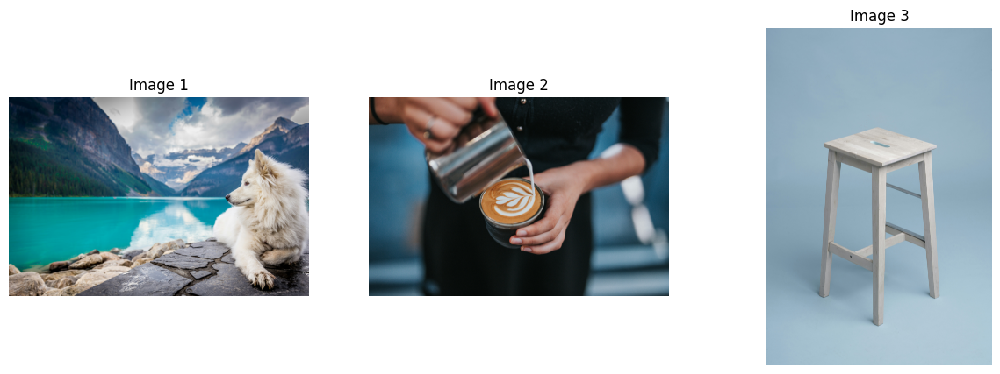

In [7]:
import cv2
import matplotlib.pyplot as plt

# Load images
img  = cv2.imread('cv_labimg1.jpeg')
img1 = cv2.imread('cv_labimg2.jpeg')
img2 = cv2.imread('cv_labimg3.jpeg')

# Convert BGR → RGB
img_rgb  = cv2.cvtColor(img,  cv2.COLOR_BGR2RGB)
img_rgb1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img_rgb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Create subplots
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.axis('off')
plt.title("Image 1")

plt.subplot(1, 3, 2)
plt.imshow(img_rgb1)
plt.axis('off')
plt.title("Image 2")

plt.subplot(1, 3, 3)
plt.imshow(img_rgb2)
plt.axis('off')
plt.title("Image 3")

plt.show()


### no lamp in above images - Vertical pole + bulb

### smooth metallic or plastic surface

### Placement (on table) - often on a desk or near a wall

## TASK 2 

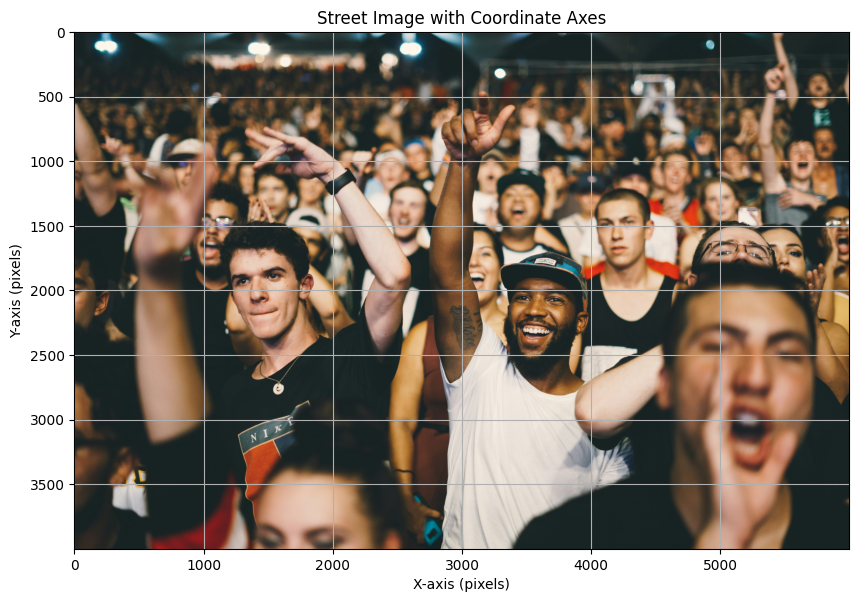

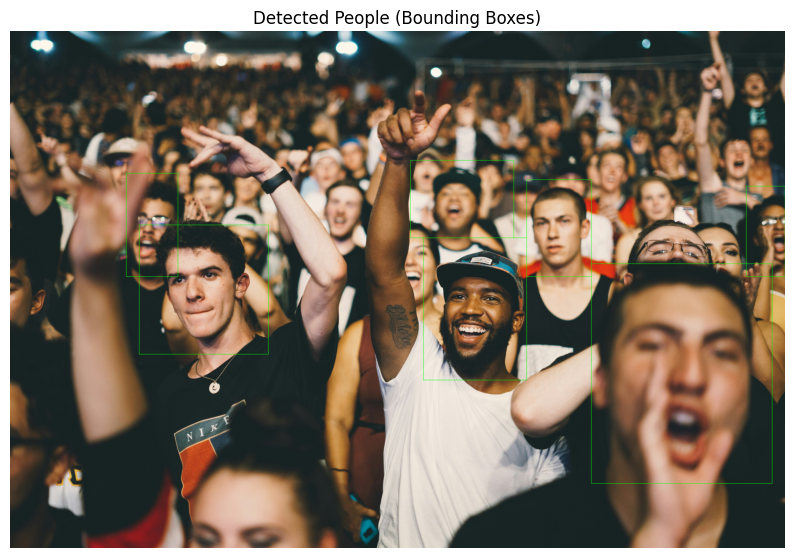

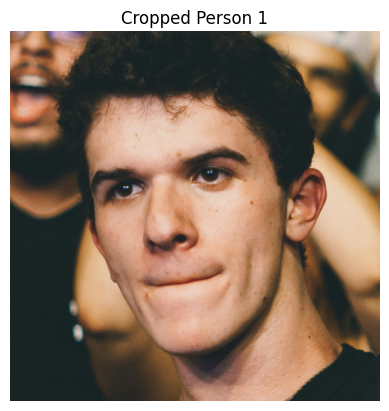

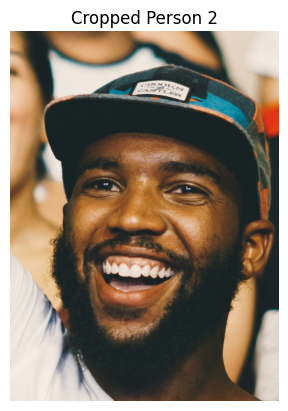

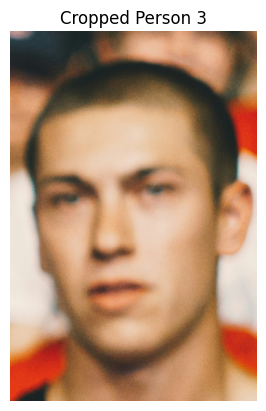

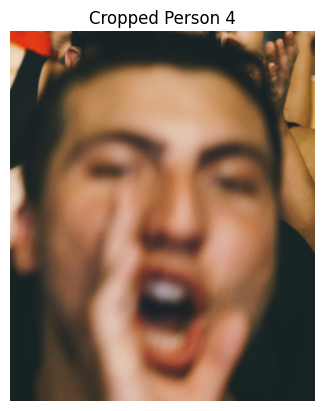

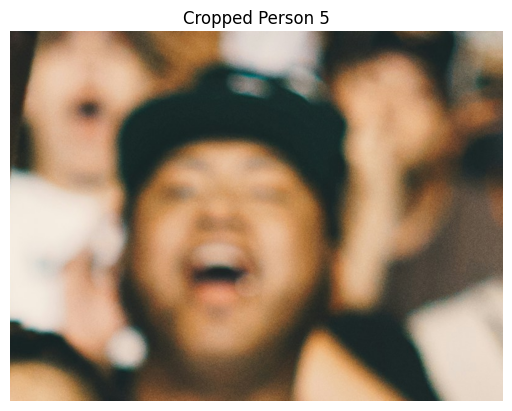

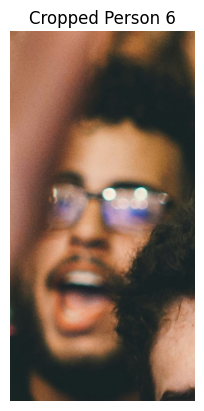

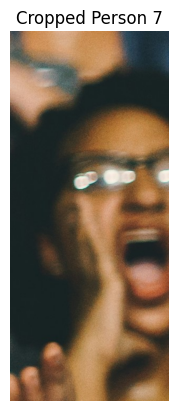

Bounding Box Coordinates (x1, y1, x2, y2):
Person 1: (1000, 1500, 2000, 2500)
Person 2: (3200, 1600, 4000, 2700)
Person 3: (4000, 1150, 4500, 1900)
Person 4: (4500, 1800, 5900, 3500)
Person 5: (3100, 1000, 3900, 1600)
Person 6: (900, 1100, 1300, 1900)
Person 7: (5700, 1200, 6000, 1900)


In [44]:
import cv2
import matplotlib.pyplot as plt

# Load image
img = cv2.imread('crowd.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Display original image with coordinate axes for reference
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.title("Street Image with Coordinate Axes")
plt.xlabel("X-axis (pixels)")
plt.ylabel("Y-axis (pixels)")
plt.grid(True)
plt.show()

# Example bounding boxes (replace with your manual coordinates)
boxes = [
    (1000, 1500, 2000, 2500),   
    (3200, 1600, 4000, 2700),  
    (4000, 1150, 4500, 1900),  
    (4500, 1800, 5900, 3500),  
    (3100, 1000, 3900, 1600),  
    (900,1100,1300,1900),
    (5700,1200,6000,1900),
]
# Draw rectangles on a copy of the image
img_boxes = img_rgb.copy()
for i, (x1, y1, x2, y2) in enumerate(boxes):
    cv2.rectangle(img_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Display image with bounding boxes (no axes)
plt.figure(figsize=(10, 8))
plt.imshow(img_boxes)
plt.title("Detected People (Bounding Boxes)")
plt.axis('off')  # Remove axes
plt.show()

# Crop and display each detected person
for i, (x1, y1, x2, y2) in enumerate(boxes):
    crop = img_rgb[y1:y2, x1:x2]
    plt.figure()
    plt.imshow(crop)
    plt.title(f"Cropped Person {i+1}")
    plt.axis('off')  # Clean display
    plt.show()

# Print bounding box coordinates
print("Bounding Box Coordinates (x1, y1, x2, y2):")
for i, box in enumerate(boxes):
    print(f"Person {i+1}: {box}")


## TASK 3 
### Potala Palace - Roof style: Multi-tiered roofs with golden ornaments.
### Silhouette: Stepped structure ascending a hill.
### Symmetry: Mostly asymmetrical; sprawling complex.
### Color: White and red walls with golden roof highlights.
### Eiffel Tower - Roof style: Not applicable; it’s a tower.
### Silhouette: Tall, slender lattice tower, tapering towards the top.
### Symmetry: Vertical symmetry along the central axis.
### Color: Iron/metallic (usually dark bronze).
### Taj Mahal - Roof style: Large central dome with smaller domes around.
### Silhouette: Distinct bulbous central dome, flanked by minarets.
### Symmetry: Perfect bilateral symmetry.
### Color: White marble.
### If the image has a stepped, multi-tiered complex with golden roofs, it’s Potala Palace. If it’s a tall lattice tower, it’s Eiffel Tower. If it’s white, symmetrical with a large central dome, it’s Taj Mahal. If none of these cues match, classify as Unknown.

## TASK 4 

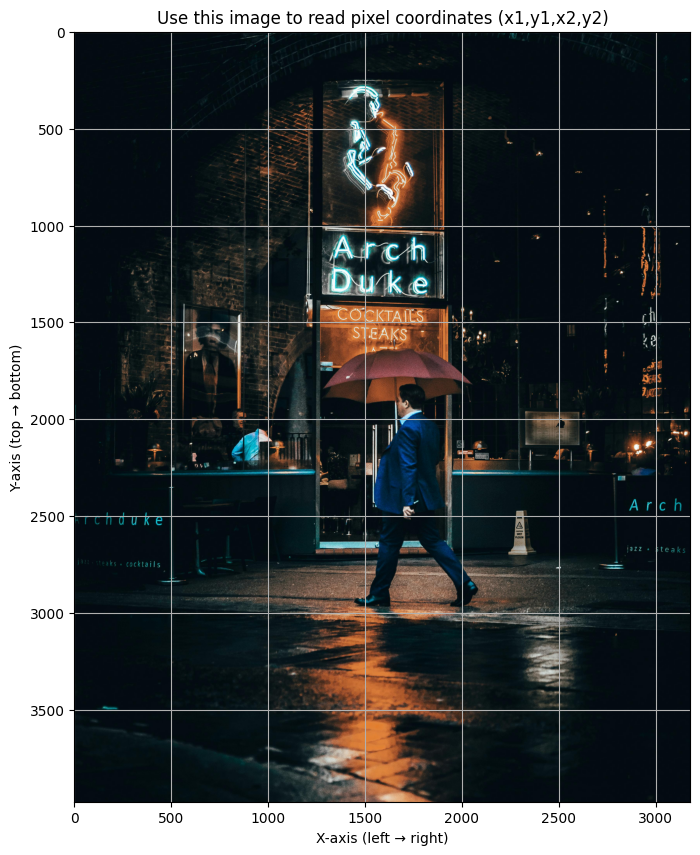

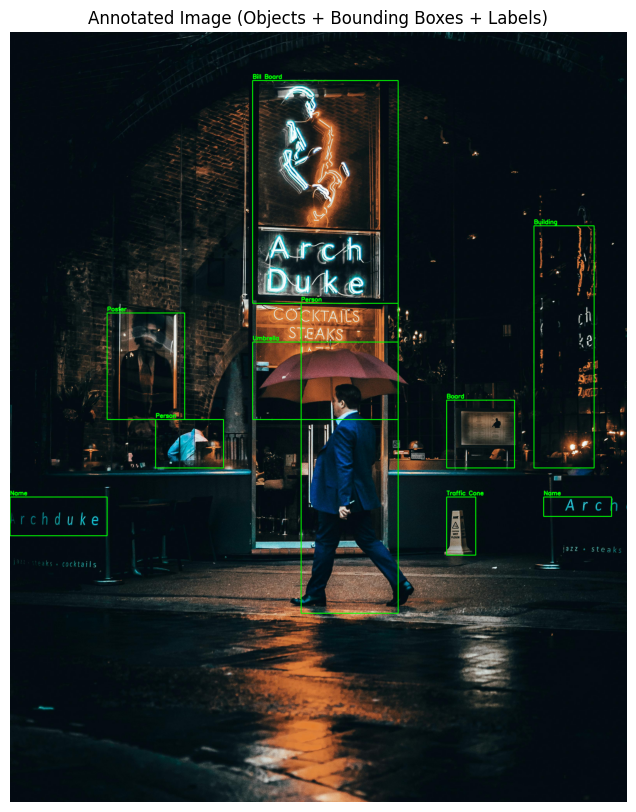

Bounding Box Coordinates Used:
Person: (1500, 1400, 2000, 3000)
Poster: (500, 1450, 900, 2000)
Umbrella: (1250, 1600, 2000, 2000)
Traffic Cone: (2250, 2400, 2400, 2700)
Building: (2700, 1000, 3010, 2250)
Bill Board: (1250, 250, 2000, 1400)
Person: (750, 2000, 1100, 2250)
Board: (2250, 1900, 2600, 2250)
Name: (2750, 2400, 3100, 2500)
Name: (0, 2400, 500, 2600)


In [16]:
import cv2
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. LOAD IMAGE
# ---------------------------------------------------------
img = cv2.imread('classification.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# ---------------------------------------------------------
# 2. SHOW IMAGE WITH AXES SO YOU CAN READ COORDINATES
# ---------------------------------------------------------
plt.figure(figsize=(12, 10))
plt.imshow(img_rgb)
plt.title("Use this image to read pixel coordinates (x1,y1,x2,y2)")
plt.xlabel("X-axis (left → right)")
plt.ylabel("Y-axis (top → bottom)")
plt.grid(True)
plt.show()

# ---------------------------------------------------------
# 3. MANUAL OBJECT COORDINATES (EXAMPLE FILLED FOR YOU)
# ---------------------------------------------------------
# Format:  (x1, y1, x2, y2, "label")
objects = [
        (1500, 1400, 2000, 3000, "Person"),
    (500, 1450, 900, 2000, "Poster"),
        (1250, 1600, 2000, 2000, "Umbrella"),
        (2250, 2400, 2400, 2700, "Traffic Cone"),
            (2700, 1000, 3010, 2250, "Building"),
                (1250, 250, 2000, 1400, "Bill Board"),
                (750, 2000, 1100, 2250, "Person"),
                (2250, 1900, 2600, 2250, "Board"),
                (2750, 2400, 3100, 2500, "Name"),
                (0, 2400, 500, 2600, "Name"),    
]

# ---------------------------------------------------------
# 4. DRAW BOUNDING BOXES + LABELS
# ---------------------------------------------------------
img_annotated = img_rgb.copy()

for (x1, y1, x2, y2, label) in objects:
    # Draw bounding box
    cv2.rectangle(img_annotated, (x1, y1), (x2, y2), (0, 255, 0), 3)

    # Draw label
    cv2.putText(
        img_annotated, label, (x1, y1 - 10),
        cv2.FONT_HERSHEY_SIMPLEX, 1.0,
        (0, 255, 0), 3, cv2.LINE_AA
    )

# ---------------------------------------------------------
# 5. DISPLAY FINAL ANNOTATED IMAGE
# ---------------------------------------------------------
plt.figure(figsize=(12, 10))
plt.imshow(img_annotated)
plt.title("Annotated Image (Objects + Bounding Boxes + Labels)")
plt.axis("off")
plt.show()

# ---------------------------------------------------------
# 6. PRINT OUT COORDINATES CLEANLY
# ---------------------------------------------------------
print("Bounding Box Coordinates Used:")
for (x1, y1, x2, y2, label) in objects:
    print(f"{label}: ({x1}, {y1}, {x2}, {y2})")


# TASK 5 
## 1. Presence of sky often indicates outdoor.
## Blue/clear sky → typical nature or city outdoors.
## Ceiling or artificial lighting → indoor.

## 2. Buildings
## High-rise buildings, skyscrapers → city / urban.
## Small cottages → rural / village.
## Sports arenas → sports / stadium.

## 3. Trees / Vegetation
## Dense trees, grass → nature / forest / park.
## Indoor plants → still indoor, not nature.

## 4. Lighting
## Sunlight or shadows → outdoor.
## Artificial light, lamps → indoor.
## Stadium floodlights → sports / stadium.

# Task 6

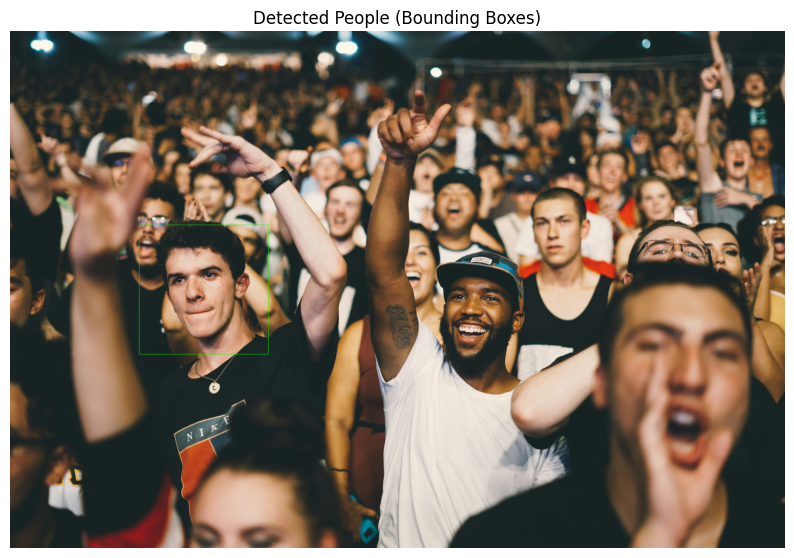

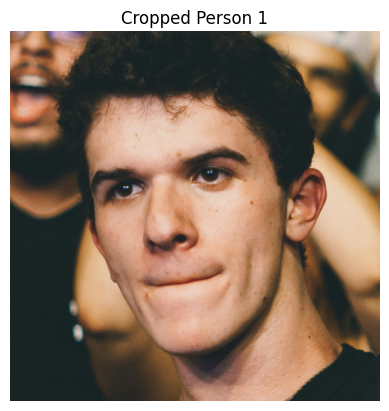

Bounding Box Coordinates (x1, y1, x2, y2):
Person 1: (1000, 1500, 2000, 2500)
Scale Change (Big Image Resized) → Best Match Score: 0.4887


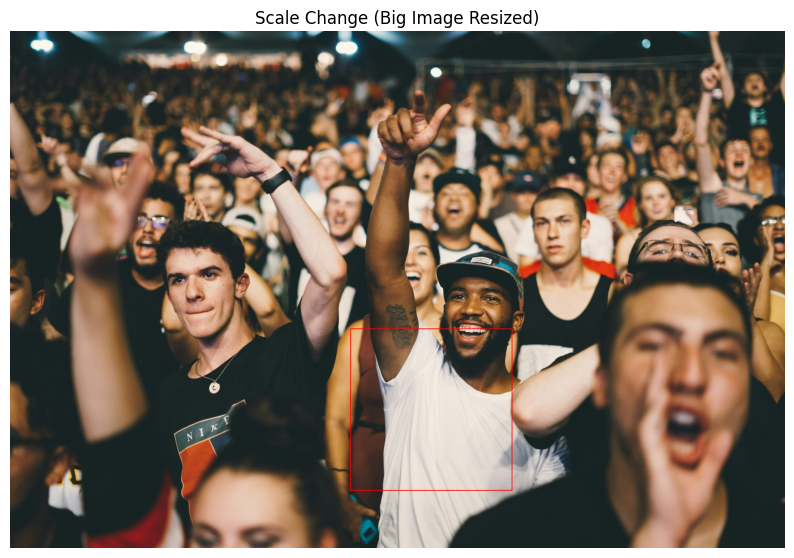

Illumination Change (Big Image Darkened) → Best Match Score: 0.9583


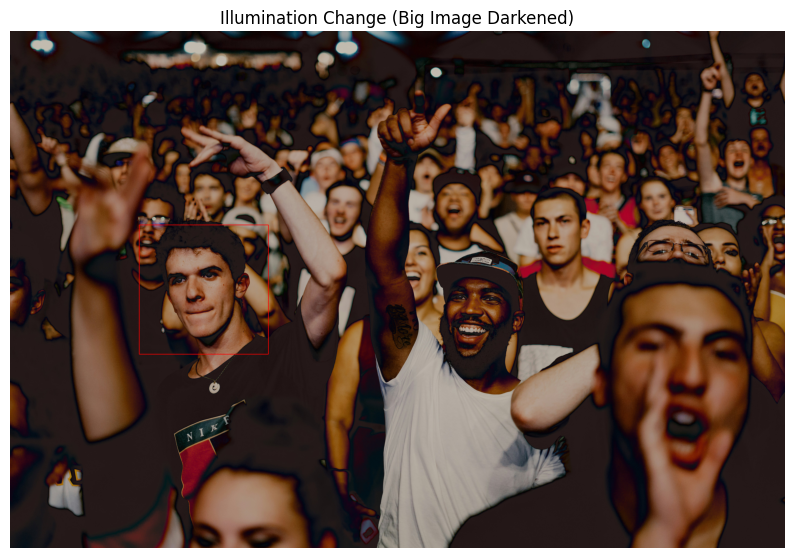

Occlusion with Stripes (Full Image) → Best Match Score: 0.2812


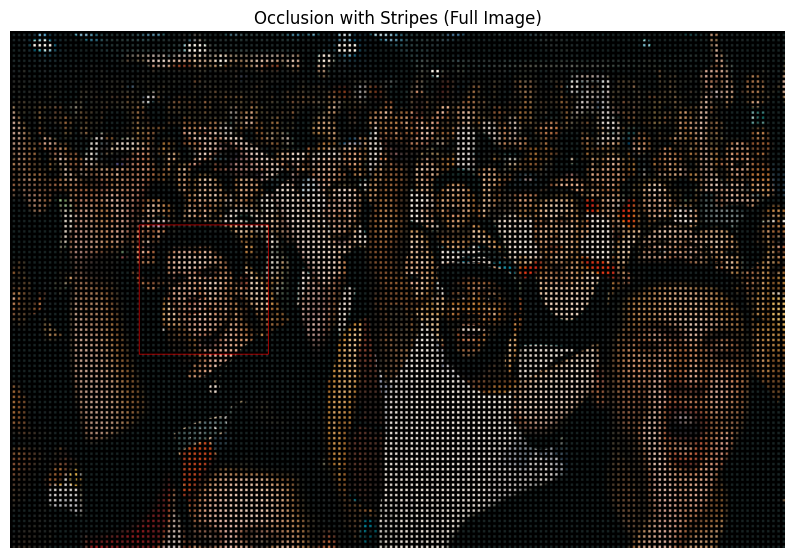

Deformation (Big Image Warped) → Best Match Score: 0.9931


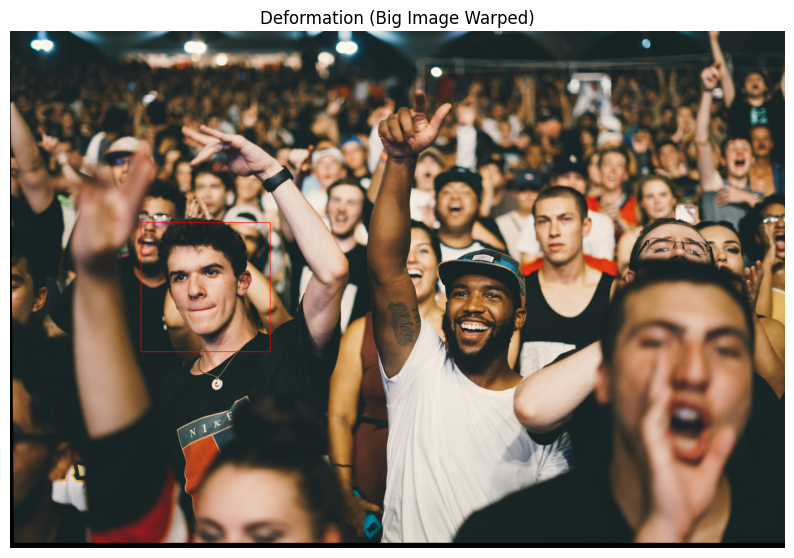

Background Clutter (Noise Added) → Best Match Score: 0.9930


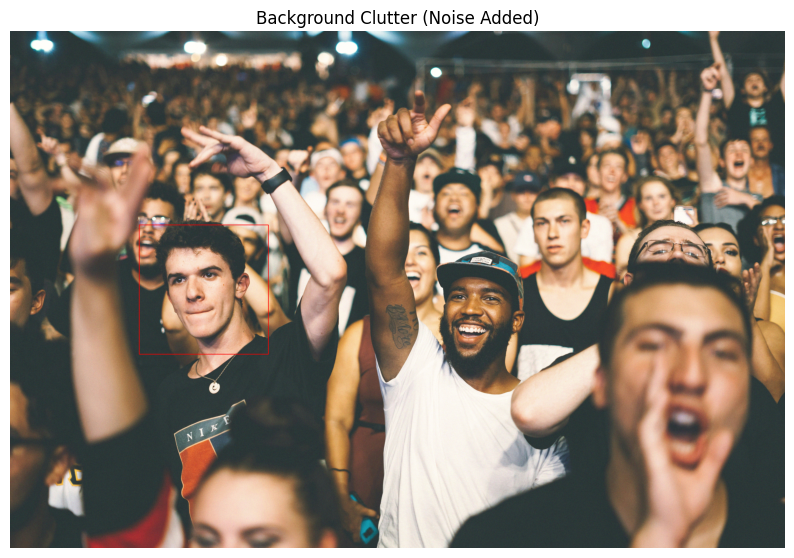

Viewpoint Change (Big Image Rotated) → Best Match Score: 0.4888


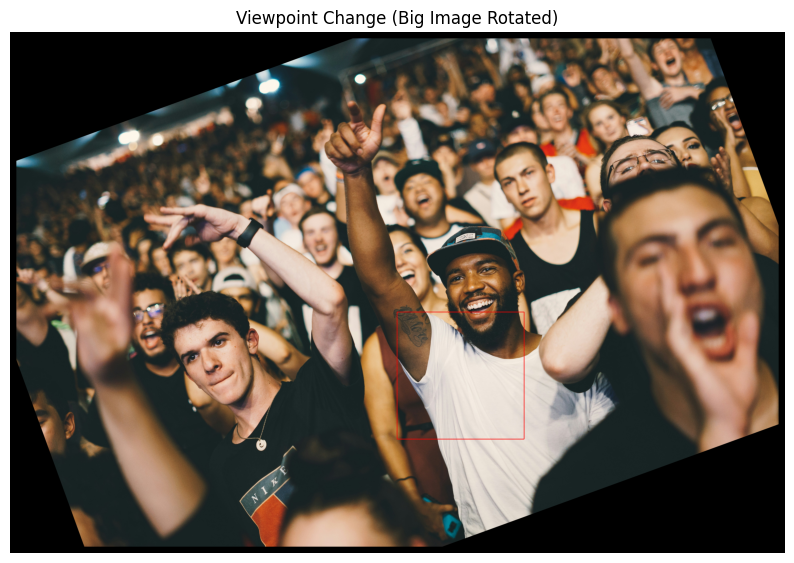

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# LOAD IMAGE
# -----------------------------
img = cv2.imread('crowd.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# -----------------------------
# EXAMPLE BOUNDING BOXES
# -----------------------------
boxes = [
    (1000, 1500, 2000, 2500),   
]

# Draw rectangles on a copy of the image
img_boxes = img_rgb.copy()
for i, (x1, y1, x2, y2) in enumerate(boxes):
    cv2.rectangle(img_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(10, 8))
plt.imshow(img_boxes)
plt.title("Detected People (Bounding Boxes)")
plt.axis('off')
plt.show()

# Crop and display each detected person
templates = []
for i, (x1, y1, x2, y2) in enumerate(boxes):
    crop = img_rgb[y1:y2, x1:x2]
    templates.append(crop)
    plt.figure()
    plt.imshow(crop)
    plt.title(f"Cropped Person {i+1}")
    plt.axis('off')
    plt.show()

print("Bounding Box Coordinates (x1, y1, x2, y2):")
for i, box in enumerate(boxes):
    print(f"Person {i+1}: {box}")

# -----------------------------
# TEMPLATE MATCHING ON ALTERED IMAGES
# -----------------------------
def run_template_match(big_img, template, title):
    big_gray = cv2.cvtColor(big_img, cv2.COLOR_RGB2GRAY)
    temp_gray = cv2.cvtColor(template, cv2.COLOR_RGB2GRAY)
    th, tw = temp_gray.shape

    result = cv2.matchTemplate(big_gray, temp_gray, cv2.TM_CCOEFF_NORMED)
    _, max_val, _, max_loc = cv2.minMaxLoc(result)

    top_left = max_loc
    bottom_right = (top_left[0] + tw, top_left[1] + th)

    detected = big_img.copy()
    cv2.rectangle(detected, top_left, bottom_right, (255, 0, 0), 3)

    print(f"{title} → Best Match Score: {max_val:.4f}")

    plt.figure(figsize=(10, 8))
    plt.imshow(detected)
    plt.title(title)
    plt.axis('off')
    plt.show()


# Use first cropped person as template
template_fixed = templates[0]
original_big = img_rgb.copy()

x1, y1, x2, y2 = boxes[0]  # template original location

# -----------------------------
# 1. SCALE CHANGE
# -----------------------------
scaled_big = cv2.resize(original_big, None, fx=0.8, fy=0.8)
run_template_match(scaled_big, template_fixed, "Scale Change (Big Image Resized)")

# -----------------------------
# 2. ILLUMINATION CHANGE
# -----------------------------
illum_big = cv2.convertScaleAbs(original_big, alpha=1.0, beta=-60)
run_template_match(illum_big, template_fixed, "Illumination Change (Big Image Darkened)")

# -----------------------------
# 3. OCCLUSION WITH STRIPES OVER WHOLE IMAGE
# -----------------------------
occ_big = original_big.copy()

# Parameters for stripes
stripe_width = 20  # width of each black stripe in pixels
spacing = 40       # space between stripes

# Draw vertical black stripes across the whole image
for x in range(0, occ_big.shape[1], spacing):
    cv2.rectangle(occ_big, (x, 0), (x + stripe_width, occ_big.shape[0]), (0, 0, 0), -1)

# Draw horizontal black stripes across the whole image
for y in range(0, occ_big.shape[0], spacing):
    cv2.rectangle(occ_big, (0, y), (occ_big.shape[1], y + stripe_width), (0, 0, 0), -1)

run_template_match(occ_big, template_fixed, "Occlusion with Stripes (Full Image)")


# -----------------------------
# 4. DEFORMATION
# -----------------------------
rows, cols, _ = original_big.shape
pts1 = np.float32([[0,0],[cols,0],[0,rows]])
pts2 = np.float32([[0,0],[cols,0],[30,rows-40]])
affine = cv2.getAffineTransform(pts1, pts2)
deform_big = cv2.warpAffine(original_big, affine, (cols, rows))
run_template_match(deform_big, template_fixed, "Deformation (Big Image Warped)")

# -----------------------------
# 5. BACKGROUND CLUTTER
# -----------------------------
noise = np.random.randint(0, 40, original_big.shape, dtype=np.uint8)
clutter_big = cv2.add(original_big, noise)
run_template_match(clutter_big, template_fixed, "Background Clutter (Noise Added)")

# -----------------------------
# 6. VIEWPOINT CHANGE
# -----------------------------
M = cv2.getRotationMatrix2D((cols//2, rows//2), 20, 1)
rot_big = cv2.warpAffine(original_big, M, (cols, rows))
rot_big = cv2.copyMakeBorder(rot_big, 50, 50, 50, 50, cv2.BORDER_CONSTANT)
run_template_match(rot_big, template_fixed, "Viewpoint Change (Big Image Rotated)")


## Template matching is when u take the cropped img of wht ur looking for (template) and pass it over the larger img and look for it - match pixels 

### As u can see it fails when you resize or rotate the img

# TASK 7

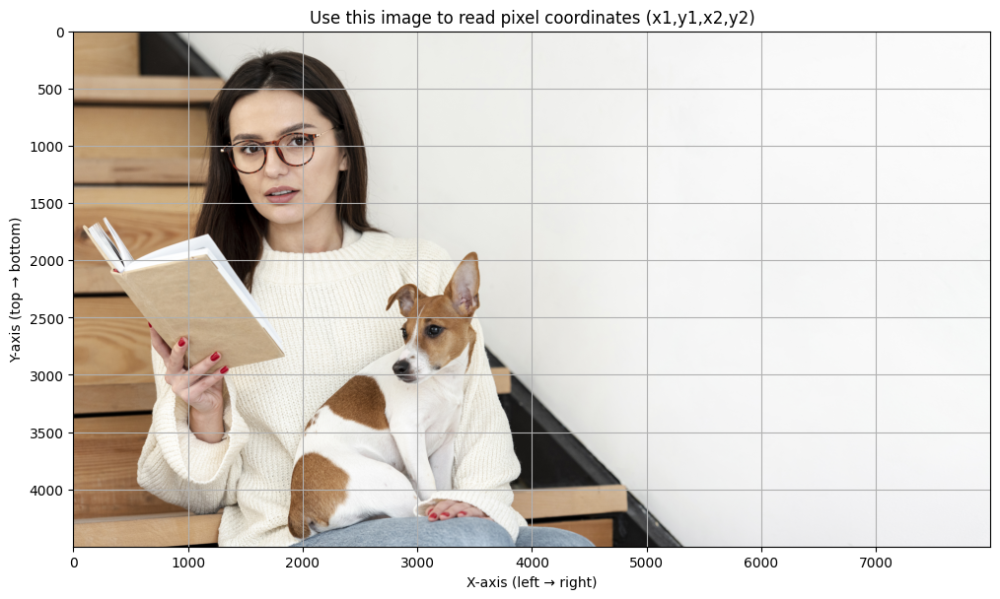

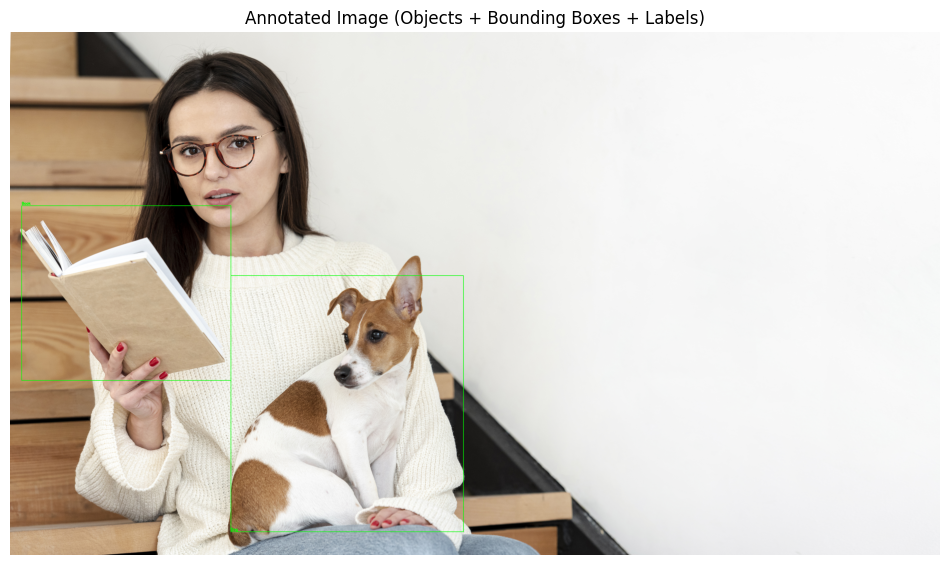

Bounding Box Coordinates Used:
Dog: (1900, 4300, 3900, 2100)
Book: (100, 1500, 1900, 3000)


In [6]:
import cv2
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. LOAD IMAGE
# ---------------------------------------------------------
img = cv2.imread('task7.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# ---------------------------------------------------------
# 2. SHOW IMAGE WITH AXES SO YOU CAN READ COORDINATES
# ---------------------------------------------------------
plt.figure(figsize=(12, 10))
plt.imshow(img_rgb)
plt.title("Use this image to read pixel coordinates (x1,y1,x2,y2)")
plt.xlabel("X-axis (left → right)")
plt.ylabel("Y-axis (top → bottom)")
plt.grid(True)
plt.show()

# ---------------------------------------------------------
# 3. MANUAL OBJECT COORDINATES (EXAMPLE FILLED FOR YOU)
# ---------------------------------------------------------
# Format:  (x1, y1, x2, y2, "label")
objects = [
        (1900, 4300, 3900, 2100, "Dog"),
    (100, 1500, 1900, 3000, "Book"), 
]

# ---------------------------------------------------------
# 4. DRAW BOUNDING BOXES + LABELS
# ---------------------------------------------------------
img_annotated = img_rgb.copy()

for (x1, y1, x2, y2, label) in objects:
    # Draw bounding box
    cv2.rectangle(img_annotated, (x1, y1), (x2, y2), (0, 255, 0), 3)

    # Draw label
    cv2.putText(
        img_annotated, label, (x1, y1 - 10),
        cv2.FONT_HERSHEY_SIMPLEX, 1.0,
        (0, 255, 0), 3, cv2.LINE_AA
    )

# ---------------------------------------------------------
# 5. DISPLAY FINAL ANNOTATED IMAGE
# ---------------------------------------------------------
plt.figure(figsize=(12, 10))
plt.imshow(img_annotated)
plt.title("Annotated Image (Objects + Bounding Boxes + Labels)")
plt.axis("off")
plt.show()

# ---------------------------------------------------------
# 6. PRINT OUT COORDINATES CLEANLY
# ---------------------------------------------------------
print("Bounding Box Coordinates Used:")
for (x1, y1, x2, y2, label) in objects:
    print(f"{label}: ({x1}, {y1}, {x2}, {y2})")


### There is a dog and a book as shown by manual detection
### When using a model, it might classify the dog as some other similar animal like a cat.
### The book might be classified incorrectly as an Ipad 

# TASK 8 

### Cropping and making the boxes - the coordinates for the box was difficult
### the detection of images could be automated
### recognition is v sensitive - slight changes affects it